# Import Modules

In [1]:
import pandas as pd #data analysis library
import numpy as np  #math library, mostly for working with arrays, broadcasting
import matplotlib.pyplot as plt #for creating charts/graphs
import os #big module for all sorts of OS dependant functions, but in this case just using to read the contents of a directory
import random #get random numbers
from keras.preprocessing.image import load_img #function that returns a PIL image that can then be worked with
import tensorflow as tf


#ignore/don't display warnings
import warnings
warnings.filterwarnings('ignore')

# Create Dataframe for Input and Output

In [7]:
input_path = [] #image path
label = [] #image label, i.e. 0 = cat, 1 = dog

# Replace file path with path to whatever folder is holding the training images
for class_name in os.listdir(r"C:\Users\shkly\Downloads\Ontario Tech\2023 Fall\IMCS 3010U\Animals\Animal Set C-D-N"):
  for path in os.listdir(r"C:\Users\shkly\Downloads\Ontario Tech\2023 Fall\IMCS 3010U\Animals\Animal Set C-D-N"+'\\' +class_name):
    # Replace class names with folder names of each class in the training images
    if class_name == 'Meows':
      label.append(0)

    elif class_name == 'Borks':
      label.append(1)
      
    elif class_name == 'Others':
      label.append(2)

    input_path.append(os.path.join(r"C:\Users\shkly\Downloads\Ontario Tech\2023 Fall\IMCS 3010U\Animals\Animal Set C-D-N", class_name, path))

print(input_path[12], label[12])

C:\Users\shkly\Downloads\Ontario Tech\2023 Fall\IMCS 3010U\Animals\Animal Set C-D-N\Borks\1d97824ca1.jpg 1


In [8]:
len(input_path)
len(label)

15534

In [9]:
df = pd.DataFrame()
df['images'] = input_path
df['label'] = label
df = df.sample(frac=1).reset_index(drop=True) #shuffles the data around so its not just all the cat pics then all the dog pics
df.head()

,images,label
0,C:\Users\shkly\Downloads\Ontario Tech\2023 Fal...,0
1,C:\Users\shkly\Downloads\Ontario Tech\2023 Fal...,1
2,C:\Users\shkly\Downloads\Ontario Tech\2023 Fal...,0
3,C:\Users\shkly\Downloads\Ontario Tech\2023 Fal...,0
4,C:\Users\shkly\Downloads\Ontario Tech\2023 Fal...,0


### Exploratory Data Analysis

In [ ]:
# finds corrupted images and puts them in a list so I can delete them in the next block
import PIL #Python Imaging Library
l = []
for  image in df['images']:
  try:
    img = PIL.Image.open(image)
  except:
    l.append(image)
l

In [10]:
# delete non-jpg files
# gotta do this part becuase otherwise the model comes accross the non-jpg files while
# training and throws an error becuase it doesn't know what to do with them

#just find and print the non-jpg files
for i in df['images']:
  if ('.jpg' not in i) and ('.jpeg' not in i):
    print(i)

# delete the files you don't like
# not super efficient, but there's not many in this case
df = df[df['images'] != 'C:\\Users\\shkly\\Downloads\\Ontario Tech\\2023 Fall\\IMCS 3010U\\Animals\\Animal Set C-B-F\\Major Blub\\desktop.ini']
len(df)

15534

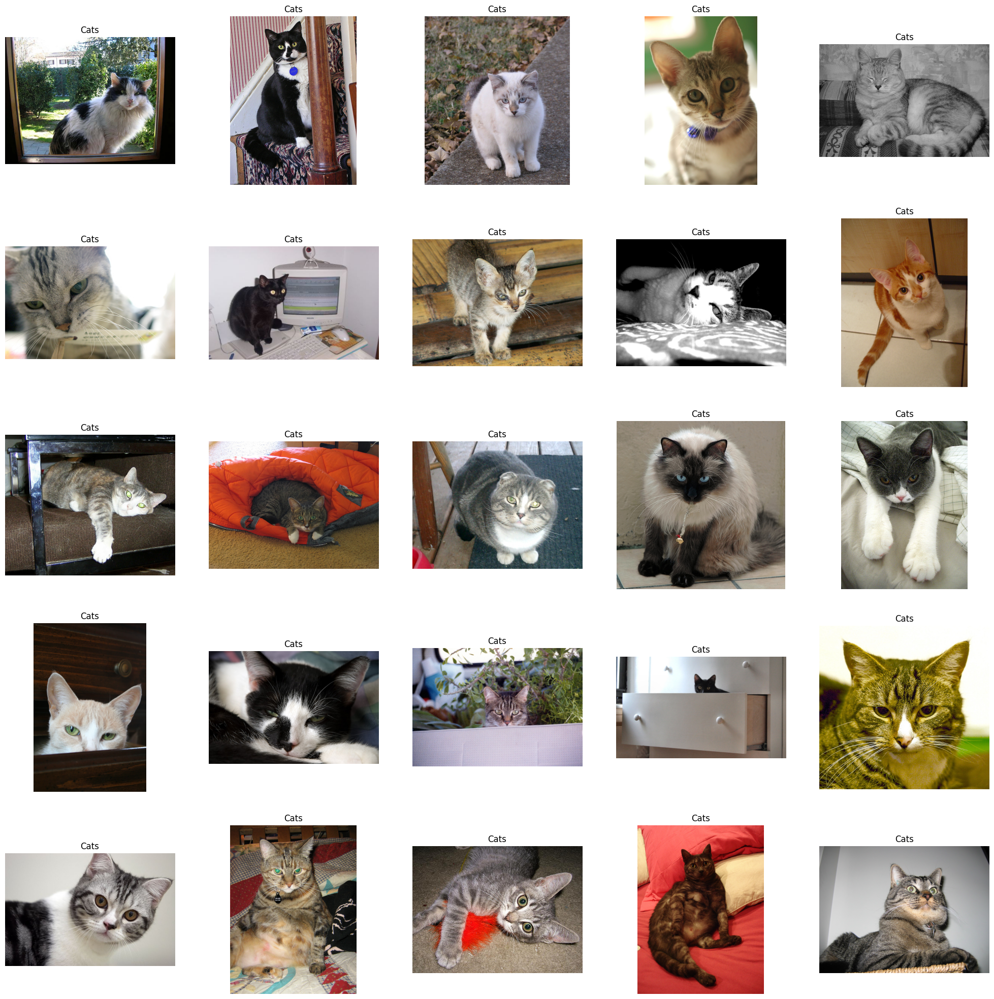

In [11]:
plt.figure(figsize=(25,25)) #to display grid of images

temp = df[df['label'] == 0]['images'] #the cat photos
start = random.randint(0, len(temp))
files = temp[start:start+25] #get 25 images

for index, file in enumerate(files):
  plt.subplot(5,5, index+1)
  img = load_img(file)
  img = np.array(img)
  plt.imshow(img)
  plt.title('Cats')
  plt.axis('off')

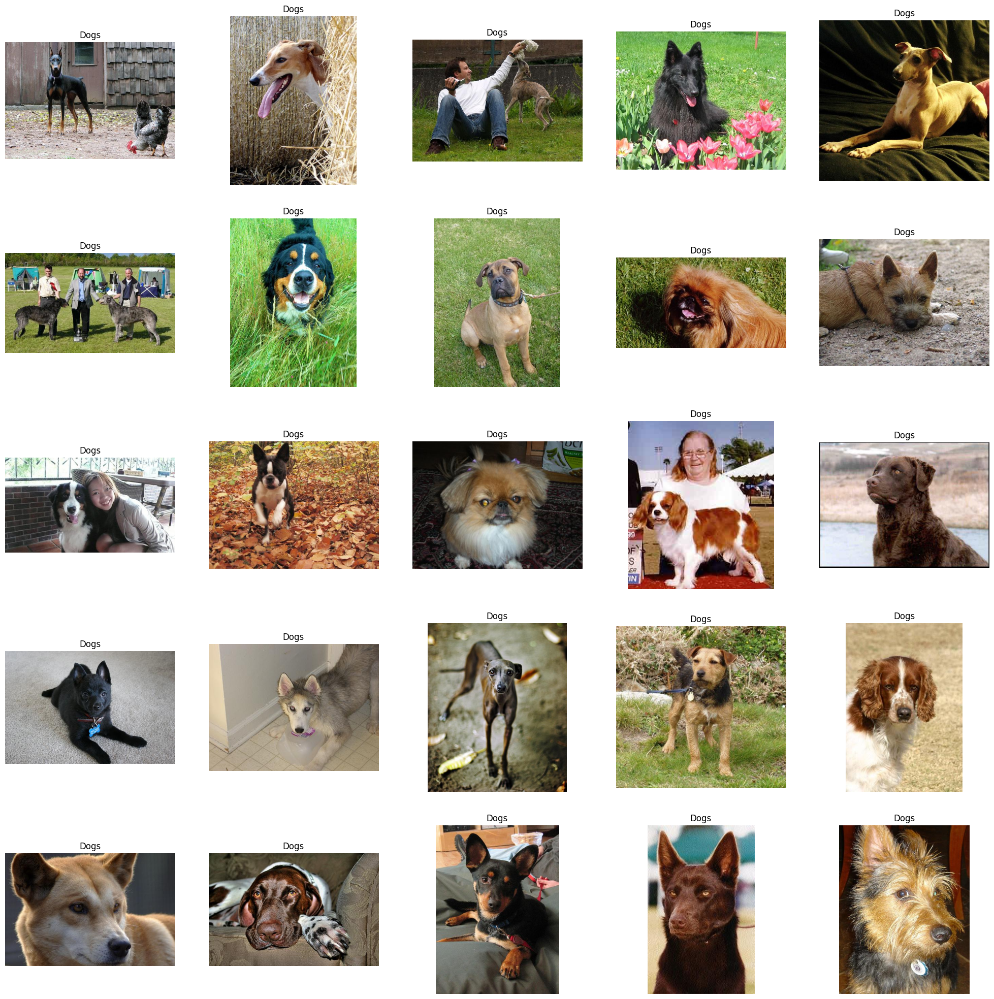

In [12]:
plt.figure(figsize=(25,25)) #to display grid of images

temp = df[df['label'] == 1]['images'] #the dog photos
start = random.randint(0, len(temp))
files = temp[start:start+25] #get 25 images

for index, file in enumerate(files):
  plt.subplot(5,5, index+1)
  img = load_img(file)
  img = np.array(img)
  plt.imshow(img)
  plt.title('Dogs')
  plt.axis('off')


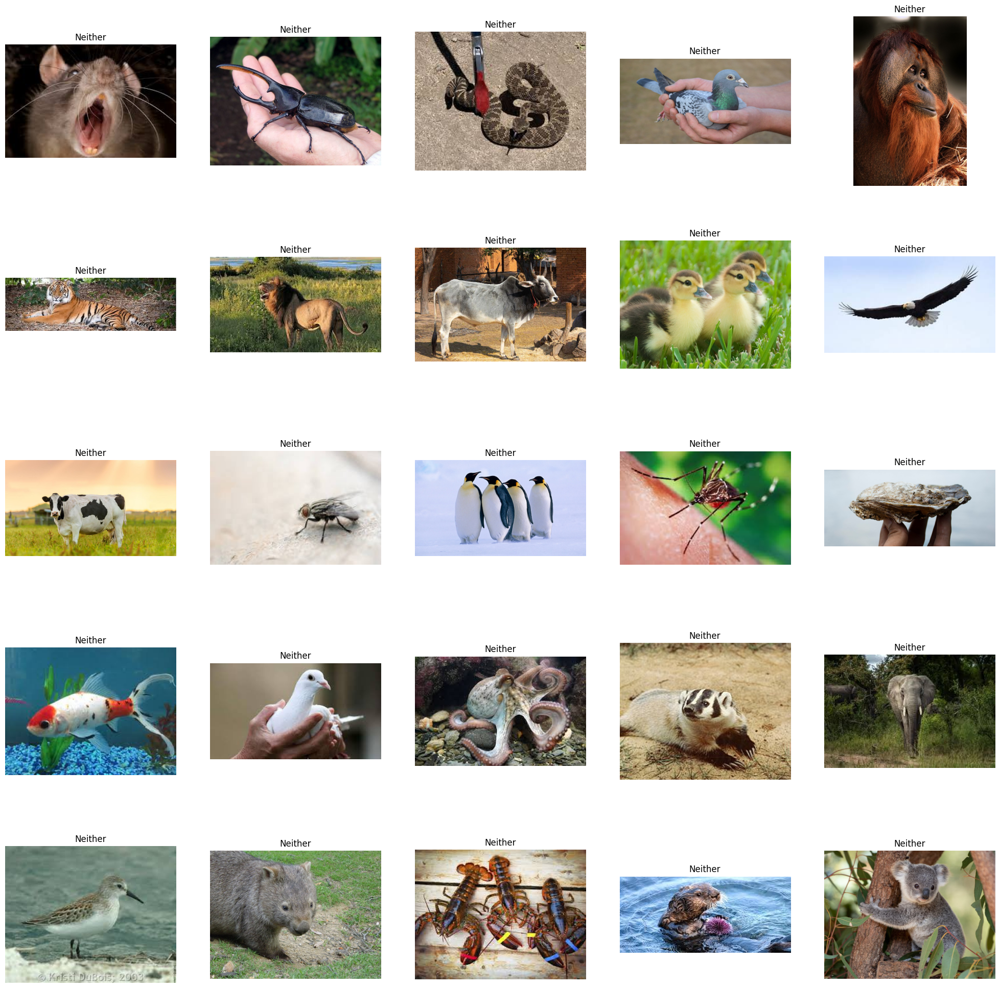

In [13]:
plt.figure(figsize=(25,25)) #to display grid of images

temp = df[df['label'] == 2]['images'] #the neither photos
start = random.randint(0, len(temp))
files = temp[start:start+25] #get 25 images

for index, file in enumerate(files):
  plt.subplot(5,5, index+1)
  img = load_img(file)
  img = np.array(img)
  plt.imshow(img)
  plt.title('Neither')
  plt.axis('off')

### Create Data Genererator for the Images

In [14]:
# This bit converts all the labels into strings instead of integers so that the
# 'class_mode' part of 'flow_from_dataframe' works
df['label'] = df['label'].astype('str')
df.head()

,images,label
0,C:\Users\shkly\Downloads\Ontario Tech\2023 Fal...,0
1,C:\Users\shkly\Downloads\Ontario Tech\2023 Fal...,1
2,C:\Users\shkly\Downloads\Ontario Tech\2023 Fal...,0
3,C:\Users\shkly\Downloads\Ontario Tech\2023 Fal...,0
4,C:\Users\shkly\Downloads\Ontario Tech\2023 Fal...,0


In [15]:
# input split (so that model.fit works, specifically the 'validation_data=val_iterator' part)
from sklearn.model_selection import train_test_split
train, test = train_test_split(df, test_size=0.2, random_state=42) # Takes df and splits of 20% of it for validation

In [16]:
from keras.preprocessing.image import ImageDataGenerator
train_generator = ImageDataGenerator(
    rescale = 1./255 , #normalization of images, each pixel has RGB values between 0-255, so this just makes them between 0-1
    rotation_range = 40 ,           #augmentation of images to avoid overfitting
    shear_range = 0.2 ,             #augmentation of images to avoid overfitting
    zoom_range = 0.2 ,              #augmentation of images to avoid overfitting
    horizontal_flip = True ,        #augmentation of images to avoid overfitting
    fill_mode = 'nearest'           #augmentation of images to avoid overfitting
)

val_generator = ImageDataGenerator(rescale=1./255)

train_iterator = train_generator.flow_from_dataframe(train,
                                                     x_col='images',
                                                     y_col='label',
                                                     target_size=(128,128),
                                                     batch_size=512,
                                                     class_mode='categorical'
                                                     )

val_iterator = val_generator.flow_from_dataframe(test,
                                                 x_col='images',
                                                 y_col='label',
                                                 target_size=(128,128),
                                                 batch_size=512,
                                                 class_mode='categorical'
                                                 )

Found 12427 validated image filenames belonging to 3 classes.
Found 3107 validated image filenames belonging to 3 classes.


### Model Creation

In [17]:
from keras import Sequential
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense, Dropout

model = Sequential([
    Conv2D(16, (3,3), activation='relu', input_shape=(128,128,3)), #first hidden layer with 16 hidden units and (3,3) kernel size
    MaxPool2D((2,2)),
    Conv2D(32, (3,3), activation='relu'), #don't have to put input_shape a second time since it assumes from the first time
    MaxPool2D((2,2)),
    Conv2D(64, (3,3), activation='relu'),
    MaxPool2D((2,2)),
    Flatten(),
    Dense(512, activation='relu'),
    Dropout(0.2),
    Dense(3, activation='softmax')
])

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 126, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 63, 63, 16)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 61, 61, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 30, 30, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 28, 28, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 14, 14, 64)        0

### Train and Save Model

In [18]:
history = model.fit(train_iterator,
            epochs=20,
            validation_data=val_iterator)

model.save(r"C:\Users\shkly\Downloads\Ontario Tech\2023 Fall\IMCS 3010U\CBF Model Stuff\V3 - C-D-N - 20EModel.keras")

Epoch 1/20
25/25 [==============================] - 225s 9s/step - loss: 1.1111 - accuracy: 0.4073 - val_loss: 1.0280 - val_accuracy: 0.4683
Epoch 2/20
25/25 [==============================] - 133s 5s/step - loss: 1.0019 - accuracy: 0.4861 - val_loss: 0.9708 - val_accuracy: 0.5246
Epoch 3/20
25/25 [==============================] - 130s 5s/step - loss: 0.9574 - accuracy: 0.5281 - val_loss: 0.9434 - val_accuracy: 0.5462
Epoch 4/20
25/25 [==============================] - 134s 5s/step - loss: 0.9193 - accuracy: 0.5548 - val_loss: 0.9646 - val_accuracy: 0.5317
Epoch 5/20
25/25 [==============================] - 134s 5s/step - loss: 0.9046 - accuracy: 0.5660 - val_loss: 0.8759 - val_accuracy: 0.5919
Epoch 6/20
25/25 [==============================] - 129s 5s/step - loss: 0.8565 - accuracy: 0.5952 - val_loss: 0.8451 - val_accuracy: 0.6183
Epoch 7/20
25/25 [==============================] - 131s 5s/step - loss: 0.8427 - accuracy: 0.6077 - val_loss: 0.8604 - val_accuracy: 0.6115
Epoch 8/20
25

# Visualiziation

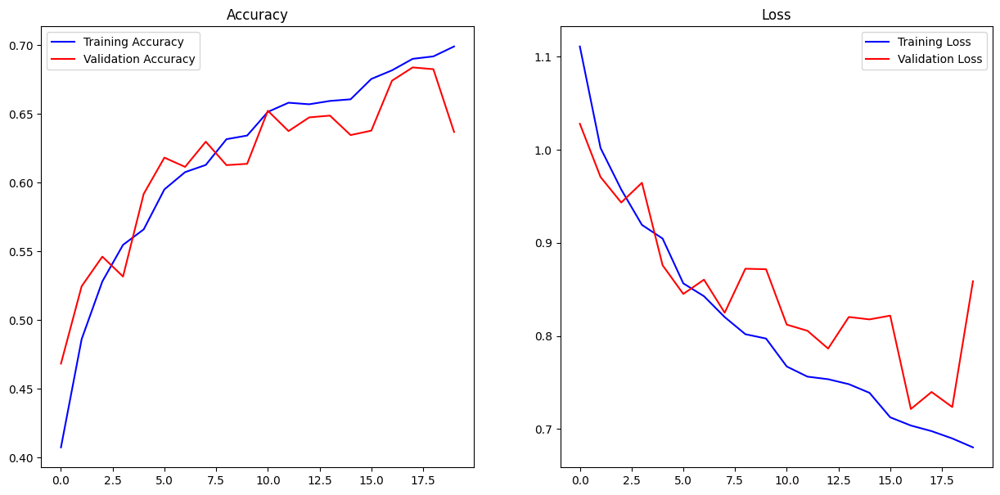

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [19]:
fig, ax = plt.subplots(1, 2, figsize=(15,7))

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(len(acc))

ax[0].plot(epochs, acc, 'b', label = "Training Accuracy")
ax[0].plot(epochs, val_acc, 'r', label = "Validation Accuracy")
ax[0].set_title("Accuracy")
ax[0].legend()
plt.figure()


loss = history.history['loss']
val_loss = history.history['val_loss']

ax[1].plot(epochs, loss, 'b', label = "Training Loss")
ax[1].plot(epochs, val_loss, 'r', label = "Validation Loss")
ax[1].set_title("Loss")
ax[1].legend()
plt.figure()

plt.tight_layout()
plt.show()